# Midterm Project for Machine Learning Zoom Camp 2023

# TikTok User Engagement Data

# Table of Contents
- [Problem description](#problem_description)
    - [About the dataset](#about_dataset)
- [Exploratory Data Analysis (EDA)](#eda)
    - [Target feature](#target_feature)
    - [Balancing categorical features](#balancing_cat_features)
        - [author_ban_status](#author_ban_status)
        - [verified_status](#verified_status)
    - [Outliers numerical features](#outliers_num_features)
    - [Feature importance analysis](#fia)
        - [For numerical](#num)
        - [For categorical](#cat)
        - [For text](#text)
- [Model training](#model_training)
    - [One hot encoding](#one_hot_encoding)
        - [Split data](#split_data)
        - [Tokenize text column](#token)
    - [Logistic Regression](#log_regression)
    - [Random Forest](#random_forest)
- [Chosen model](#model)

# Problem description
<a id='problem_description'></a>

### Overview
TikTok is the leading destination for short-form mobile video. The platform is built to help imaginations thrive. TikTok's mission is to create a place for inclusive, joyful, and authentic content–where people can safely discover, create, and connect.

### Problem
I aim to develop a machine learning model that can classify videos as either **claims or opinions**.

TikTok videos receive a large number of user reports for many different reasons. Not all reported videos can undergo review by a human moderator. Videos that make claims (as opposed to opinions) are much more likely to contain content that violates the platform’s terms of service. TikTok seeks a way to identify videos that make claims to prioritize them for review.

### Solution
To build a machine learning model that can determine whether a video contains a **claim or an opinion**, there are several stages and techniques that can be used. It is important to split the data into training, validation, and test sets to avoid overfitting and underfitting. Additionally, it is important to validate and verify your machine learning model outcomes to ensure that you're getting the right data and that the data is accurate. Finally, it is important to deploy your machine learning model in production and monitor it regularly to ensure that it continues to put out accurate, relevant information.

The data can downloaded from [kaggle](https://www.kaggle.com/datasets/yakhyojon/tiktok/data).

## About the dataset
<a id='about_dataset'></a>
		

|  Column name  |             Type             |  Description  |
|:--------:|:-----------------------------------:|:-----------------------------------:|
|    **#**   |  int  |   TikTok assigned number for video with claim/opinion.    |
|    **claim_status**   |  obj |    Whether the published video has been identified as an “opinion” or a “claim.” In this dataset, an “opinion”  to an individual’s or group’s personal belief or thought. A “claim” refers to information that is either unsourced or from an unverified source.  | 
|    **video_id**   |  int |    Random identifying number assigned to video upon publication on TikTok.  |
|   **video_duration_sec**   | int | How long the published video is measured in seconds. |
| **video_transcription_text** |    obj  | Transcribed text of the words spoken in the published video. |
| **verified_status** |  obj | Indicates the status of the TikTok user who published the video in terms of their verification, either “verified” or “not verified.”| 
|  **author_ban_status**  | obj  |Indicates the status of the TikTok user who published the video in terms of their permissions: “active,” “under scrutiny,” or “banned.” | 
| **video_view_count**  |  float | The total number of times the published video has been viewed. |
| **video_like_count**  |  float | The total number of times the published video has been liked by other users. |
| **video_share_count**  |  float | The total number of times the published video has been shared by other users. |
| **video_download_count***  |  float | The total number of times the published video has been downloaded by other users. |
| **video_comment_count***  |  float |  The total number of comments on the published video. |


# Exploratory Data Analysis (EDA)
<a id='eda'></a>

In [225]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.figure_factory as ff

from sklearn.metrics import mutual_info_score, confusion_matrix
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression

import nltk
# nltk.download('punkt')
# nltk.download('stopwords')
from collections import Counter
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from wordcloud import WordCloud

In [155]:
df = pd.read_csv('tiktok_dataset.csv')
df.columns=df.columns.str.lower().str.replace(' ','_')

In [156]:
df.head()

,#,claim_status,video_id,video_duration_sec,video_transcription_text,verified_status,author_ban_status,video_view_count,video_like_count,video_share_count,video_download_count,video_comment_count
0,1,claim,7017666017,59,someone shared with me that drone deliveries a...,not verified,under review,343296.0,19425.0,241.0,1.0,0.0
1,2,claim,4014381136,32,someone shared with me that there are more mic...,not verified,active,140877.0,77355.0,19034.0,1161.0,684.0
2,3,claim,9859838091,31,someone shared with me that american industria...,not verified,active,902185.0,97690.0,2858.0,833.0,329.0
3,4,claim,1866847991,25,someone shared with me that the metro of st. p...,not verified,active,437506.0,239954.0,34812.0,1234.0,584.0
4,5,claim,7105231098,19,someone shared with me that the number of busi...,not verified,active,56167.0,34987.0,4110.0,547.0,152.0


In [157]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19382 entries, 0 to 19381
Data columns (total 12 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   #                         19382 non-null  int64  
 1   claim_status              19084 non-null  object 
 2   video_id                  19382 non-null  int64  
 3   video_duration_sec        19382 non-null  int64  
 4   video_transcription_text  19084 non-null  object 
 5   verified_status           19382 non-null  object 
 6   author_ban_status         19382 non-null  object 
 7   video_view_count          19084 non-null  float64
 8   video_like_count          19084 non-null  float64
 9   video_share_count         19084 non-null  float64
 10  video_download_count      19084 non-null  float64
 11  video_comment_count       19084 non-null  float64
dtypes: float64(5), int64(3), object(4)
memory usage: 1.8+ MB


In [158]:
df.describe()

,#,video_id,video_duration_sec,video_view_count,video_like_count,video_share_count,video_download_count,video_comment_count
count,19382.000000,1.938200e+04,19382.000000,19084.000000,19084.000000,19084.000000,19084.000000,19084.000000
mean,9691.500000,5.627454e+09,32.421732,254708.558688,84304.636030,16735.248323,1049.429627,349.312146
std,5595.245794,2.536440e+09,16.229967,322893.280814,133420.546814,32036.174350,2004.299894,799.638865
min,1.000000,1.234959e+09,5.000000,20.000000,0.000000,0.000000,0.000000,0.000000
25%,4846.250000,3.430417e+09,18.000000,4942.500000,810.750000,115.000000,7.000000,1.000000
50%,9691.500000,5.618664e+09,32.000000,9954.500000,3403.500000,717.000000,46.000000,9.000000
75%,14536.750000,7.843960e+09,47.000000,504327.000000,125020.000000,18222.000000,1156.250000,292.000000
max,19382.000000,9.999873e+09,60.000000,999817.000000,657830.000000,256130.000000,14994.000000,9599.000000


In [159]:
df.isnull().sum()

#                             0
claim_status                298
video_id                      0
video_duration_sec            0
video_transcription_text    298
verified_status               0
author_ban_status             0
video_view_count            298
video_like_count            298
video_share_count           298
video_download_count        298
video_comment_count         298
dtype: int64

In [160]:
df = df.dropna(axis=0)

In [161]:
df=df.drop_duplicates()

In [162]:
df.nunique()

#                           19084
claim_status                    2
video_id                    19084
video_duration_sec             56
video_transcription_text    19012
verified_status                 2
author_ban_status               3
video_view_count            15632
video_like_count            12224
video_share_count            9231
video_download_count         4336
video_comment_count          2424
dtype: int64

The provided dataframe includes a mix of categorical, text, and numerical data. Each row represents a unique TikTok video that presents either a claim or an opinion, along with the accompanying metadata about that video. The dataframe contains five float64s, three int64s, and four objects. There are 19,382 observations, but some of the variables have missing values, including claim status, video transcription, and all of the count variables. Many of the count variables appear to have outliers at the high end of the distribution, with very large standard deviations and maximum values that are much higher than their quartile values.

## Target feature
<a id='target_feature'></a>

Our ultimate objective is to use machine learning to classify videos as either claims or opinions. Therefore, we start by examining the 'claim_status' variable in the provided dataframe. Specifically, we want to determine how many videos are in each different claim status. This information will help us understand the distribution of the 'claim_status' variable and inform our decisions about how to preprocess the data before building the machine learning model. We can use the following code to count the number of videos in each claim status:

In [163]:
data['claim_status'].value_counts()

claim_status
claim      57648
opinion    56856
Name: count, dtype: int64

In [164]:
px.histogram(df, x='claim_status').show()

Feature 'claim_status' - balanced.

To examine the engagement trends associated with each different claim status, we can use the provided dataset and calculate the mean and median view counts for each claim status. Here's how we can do it:

In [165]:
claims = df[df['claim_status'] == 'claim']
print('Mean view count claims:', claims['video_view_count'].mean())
print('Median view count claims:', claims['video_view_count'].median())

Mean view count claims: 501029.4527477102
Median view count claims: 501555.0


In [166]:
opinions = df[df['claim_status'] == 'opinion']
print('Mean view count opinions:', opinions['video_view_count'].mean())
print('Median view count opinions:', opinions['video_view_count'].median())

Mean view count opinions: 4956.43224989447
Median view count opinions: 4953.0


The resulting output will show the mean and median view counts for each claim status, which can help us understand the engagement trends associated with each different claim status.

## Balancing categorical features
<a id='balancing_cat_features'></a>

### author_ban_status
<a id='author_ban_status'></a>

To examine trends associated with the ban status of the author, we can use the provided dataset and calculate the mean and median view counts for each claim status based on the ban status of the author.

In [167]:
px.histogram(df, x='author_ban_status').show()

In [168]:
df.groupby(['claim_status', 'author_ban_status']).count()

#  video_id  video_duration_sec  \
claim_status author_ban_status                                       
claim        active             6566      6566                6566   
             banned             1439      1439                1439   
             under review       1603      1603                1603   
opinion      active             8817      8817                8817   
             banned              196       196                 196   
             under review        463       463                 463   

                                video_transcription_text  verified_status  \
claim_status author_ban_status                                              
claim        active                                 6566             6566   
             banned                                 1439             1439   
             under review                           1603             1603   
opinion      active                                 8817             8817   
             banned                                  196              196   
             under review                            463              463   

                                video_view_count  video_like_count  \
claim_status author_ban_status                                       
claim        active                         6566              6566   
             banned                         1439              1439   
             under review                   1603              1603   
opinion      active                         8817              8817   
             banned                          196               196   
             under review                    463               463   

                                video_share_count  video_download_count  \
claim_status author_ban_status                                            
claim        active                          6566                  6566   
             banned                          1439                  1439   
             under review                    1603                  1603   
opinion      active                          8817                  8817   
             banned                           196                   196   
             under review                     463                   463   

                                video_comment_count  
claim_status author_ban_status                       
claim        active                            6566  
             banned                            1439  
             under review                      1603  
opinion      active                            8817  
             banned                             196  
             under review                       463

In [169]:
fig = px.histogram(df, x='claim_status', color='author_ban_status', barmode='group')
fig.update_layout(title='Claims by author_ban_status histogram').show()

There are many more claim videos with banned authors than there are opinion videos with banned authors. This could mean a number of things, including the possibilities that: claim videos are more strictly policed than opinion videos and authors must comply with a stricter set of rules if they post a claim than if they post an opinion

### verified_status
<a id='verified_status'></a>

There are far fewer verified users than unverified users, but if a user is verified, they are much more likely to post opinions. To visualize this, we can create a histogram with four bars: one for each combination of claim status and verification status.

In [170]:
px.histogram(df, x='verified_status').show()

In [171]:
fig = px.histogram(df, x='claim_status', color='verified_status', barmode='group')
fig.update_layout(title='Claims by verification status histogram').show()

There are far fewer verified users than unverified ones, but if a user is verified, they are much more likely to post opinions.

Features 'verified_status', 'author_ban_status' - unbalanced.

## Outliers numerical features
<a id='outliers_num_features'></a>

In [172]:
data = pd.melt(df, id_vars='claim_status', value_vars=['video_duration_sec',
                                                       'video_view_count', 
                                                       'video_like_count', 
                                                       'video_share_count',
                                                       'video_download_count', 
                                                       'video_comment_count'])
px.box(data, x='claim_status', y='value', color='variable').show()

Features 'video_like_count', 'video_share_count', 'video_download_count', 'video_comment_count' contain outliers.

Outliers in quantitative variables can significantly affect the regression model. They can bias regression coefficients, which can lead to incorrect conclusions. In logistic regression, outliers can also bias the coefficients, which can lead to incorrect predictions. In trees, outliers can cause the tree to be too deep or too wide, which can cause the model to overfit.

## Feature importance analysis
<a id='fia'></a>

### For numerical
<a id='num'></a>

In [173]:
numerical_columns = ['video_duration_sec',
                     'video_view_count', 
                     'video_like_count', 
                     'video_share_count',
                     'video_download_count', 
                     'video_comment_count']

In [174]:
df[numerical_columns].corr()

,video_duration_sec,video_view_count,video_like_count,video_share_count,video_download_count,video_comment_count
video_duration_sec,1.000000,0.008481,0.011567,0.011560,0.013078,0.000615
video_view_count,0.008481,1.000000,0.804322,0.665635,0.664222,0.554172
video_like_count,0.011567,0.804322,1.000000,0.825789,0.823554,0.687185
video_share_count,0.011560,0.665635,0.825789,1.000000,0.679910,0.574632
video_download_count,0.013078,0.664222,0.823554,0.679910,1.000000,0.832464
video_comment_count,0.000615,0.554172,0.687185,0.574632,0.832464,1.000000


In [175]:
px.imshow(df[numerical_columns].corr(),text_auto=True, aspect="auto", color_continuous_scale='Blues')

The correlation between numeric and categorical variables is meaningless because the correlation is determined only for a pair of numeric variables.

For logistic regression, multicollinearity can be a problem because it can lead to unstable estimates of regression coefficients and reduced predictive accuracy.

Multicollinearity is not a problem with decision trees because they do not use linear relationships between variables.

Feature 'video_like_count' correlates with most variables, so we'll remove it.

### For categorical
<a id='cat'></a>

In [176]:
categorical_columns = ['verified_status', 'author_ban_status']

In [177]:
def mutual_info_success_score(series):
    return mutual_info_score(series, df.claim_status)

In [178]:
mutual_info = df[categorical_columns].apply(mutual_info_success_score)
mutual_info.sort_values(ascending=False)

author_ban_status    0.054046
verified_status      0.015708
dtype: float64

Feature 'author_ban_status' have highest mutual information

### For text
<a id='text'></a>


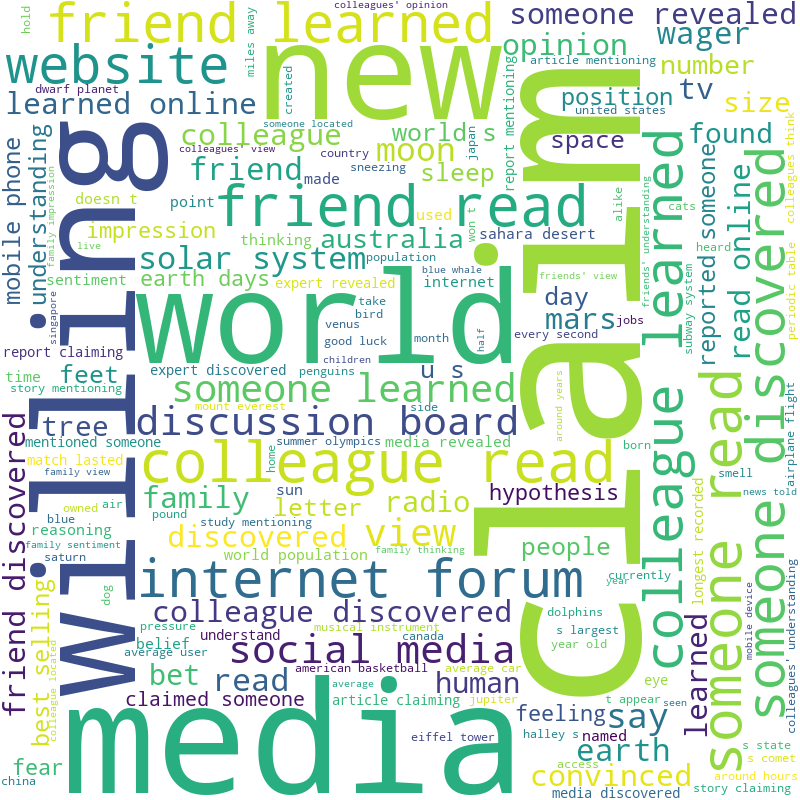

In [179]:
wordcloud = WordCloud(width=800, 
                      height=800, 
                      background_color='white', 
                      stopwords=None, 
                      min_font_size=10).generate(' '.join(df['video_transcription_text']))

fig = px.imshow(wordcloud)
fig.update_layout(title='WordCloud of video_transcription_text in TikTok Videos')
fig.show()

In [180]:
words_in_text = ' '.join(df['video_transcription_text'])
words_in_text = words_in_text.lower()
words = word_tokenize(words_in_text)

stop_words = set(stopwords.words('english'))
words = [word for word in words if word not in stop_words and word.isalpha()]
word_counts = Counter(words)
most_common_words = word_counts.most_common(10)

words, freq = zip(*most_common_words)

In [181]:
px.bar(x=words, y=freq).show()

There don't seem to be any strong keywords to help categorize them.

I want to use length of video_transcription_text as new feature.

In [182]:
df['text_length'] = df['video_transcription_text'].str.len()

In [183]:
df[['claim_status', 'text_length']].groupby('claim_status').mean()

,text_length
claim_status,
claim,95.376978
opinion,82.722562


In [184]:
px.histogram(df, x="text_length", color="claim_status",
                 nbins=20, opacity=0.7,
                 title="Distribution of video_transcription_text length for claims and opinions",
                 labels={"text_length": "Video transcription text length (number of characters)",
                         "count": "Count"}).show()

# Model training
<a id='model_training'></a>

## One hot encoding
<a id='one_hot_encoding'></a>

In [185]:
X = df.copy()
X = X.drop(['#', 'video_id'], axis=1)
X['claim_status'] = X['claim_status'].replace({'opinion': 0, 'claim': 1})
X = pd.get_dummies(X, columns=['verified_status', 'author_ban_status'], drop_first=True)

In [186]:
X.head()

,claim_status,video_duration_sec,video_transcription_text,video_view_count,video_like_count,video_share_count,video_download_count,video_comment_count,text_length,verified_status_verified,author_ban_status_banned,author_ban_status_under review
0,1,59,someone shared with me that drone deliveries a...,343296.0,19425.0,241.0,1.0,0.0,97,False,False,True
1,1,32,someone shared with me that there are more mic...,140877.0,77355.0,19034.0,1161.0,684.0,107,False,False,False
2,1,31,someone shared with me that american industria...,902185.0,97690.0,2858.0,833.0,329.0,137,False,False,False
3,1,25,someone shared with me that the metro of st. p...,437506.0,239954.0,34812.0,1234.0,584.0,131,False,False,False
4,1,19,someone shared with me that the number of busi...,56167.0,34987.0,4110.0,547.0,152.0,128,False,False,False


### Split data
<a id='split_data'></a>

In [187]:
y = X['claim_status']
X = X.drop(['claim_status'], axis=1)

In [188]:
X_full_train, X_test, y_full_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

In [189]:
X_train, X_valid, y_train, y_valid = train_test_split(X_full_train, y_full_train, test_size=0.25, random_state=0)

In [190]:
X_train.shape, X_valid.shape, X_test.shape, y_train.shape, y_valid.shape, y_test.shape

((11450, 11), (3817, 11), (3817, 11), (11450,), (3817,), (3817,))

### Tokenize text column
<a id='token'></a>

#### train

In [196]:
count_vector = CountVectorizer(ngram_range=(2, 3),
                            max_features=15,
                            stop_words='english')

In [ ]:
count_array = count_vector.fit_transform(X_train['video_transcription_text']).toarray()
count_df = pd.DataFrame(data=count_array, columns=count_vector.get_feature_names_out())
X_train_new = pd.concat([X_train.drop(columns=['video_transcription_text']).reset_index(drop=True), 
                         count_df], axis=1)

#### valid 

In [200]:
validation_count_array = count_vec.transform(X_valid['video_transcription_text']).toarray()
validation_count_df = pd.DataFrame(data=validation_count_array, columns=count_vec.get_feature_names_out())
X_valid_new = pd.concat([X_valid.drop(columns=['video_transcription_text']).reset_index(drop=True), 
                         validation_count_df], axis=1)

#### test 

In [202]:
test_count_array = count_vec.transform(X_test['video_transcription_text']).toarray()
test_count_df = pd.DataFrame(data=test_count_array, columns=count_vec.get_feature_names_out())
X_test_new = pd.concat([X_test.drop(columns=['video_transcription_text']).reset_index(drop=True), 
                          test_count_df], axis=1)

## Logistic Regression
<a id='log_regression'></a>

In [233]:
log_reg = LogisticRegression(random_state=0, max_iter=800).fit(X_train_new, y_train)

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.



In [234]:
y_predict = log_reg.predict(X_test_new)

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.



In [235]:
cm = confusion_matrix(y_valid, y_predict)
fig = ff.create_annotated_heatmap(cm, x=['Claim', 'Opinion'], y=['Claim', 'Opinion'])
fig.update_layout(title='Confusion Matrix', xaxis_title='Predicted', yaxis_title='True').show()

## Random Forest
<a id='random_forest'></a>

In [204]:
rf = RandomForestClassifier(random_state=0)

cv_params = {'max_depth': [5, 7, None],
             'max_features': [0.3, 0.6],
             'max_samples': [0.7],
             'min_samples_leaf': [1,2],
             'min_samples_split': [2,3],
             'n_estimators': [75,100,200],
             }

scoring = {'accuracy', 'precision', 'recall', 'f1'}

rf_cv = GridSearchCV(rf, cv_params, scoring=scoring, cv=5, refit='recall')

In [205]:
%%time
rf_cv.fit(X_train_new, y_train)

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is depr

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is depr

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is depr

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is depr

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is depr

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is depr

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is depr

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is depr

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is depr

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is depr

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is depr

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is depr

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is depr

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is depr

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is depr

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is depr

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is depr

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is depr

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is depr

CPU times: user 3min 54s, sys: 1.23 s, total: 3min 55s
Wall time: 3min 55s


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=0),
             param_grid={'max_depth': [5, 7, None], 'max_features': [0.3, 0.6],
                         'max_samples': [0.7], 'min_samples_leaf': [1, 2],
                         'min_samples_split': [2, 3],
                         'n_estimators': [75, 100, 200]},
             refit='recall', scoring={'precision', 'f1', 'recall', 'accuracy'})

In [216]:
rf_cv.best_score_

0.9948228253467271

In [217]:
rf_cv.best_params_

{'max_depth': None,
 'max_features': 0.6,
 'max_samples': 0.7,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 200}

In [221]:
y_predict = rf_cv.best_estimator_.predict(X_valid_new)

/Users/olga/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.



In [222]:
y_predict

array([1, 0, 1, ..., 1, 1, 1])

In [229]:
cm = confusion_matrix(y_valid, y_predict)
fig = ff.create_annotated_heatmap(cm, x=['Claim', 'Opinion'], y=['Claim', 'Opinion'])
fig.update_layout(title='Confusion Matrix', xaxis_title='Predicted', yaxis_title='True').show()

# Chosen model
<a id='model'></a>